# V928 Tau - Stellar Variation

In this notebook we model the stellar variations of V928 Tau system. We start off with the corrected light curve from the <strong>everest 2.0</strong> pipeline and determine the model for the stellar variations ignoring the eclipse. To do this we note here that V928 Tau is a long-period binary, which has been blended together in a single <strong>K2</strong> pixel. We see a very clear beating pattern, which we assume to be rotational modulation induced by star spots with similar rotational periods. Below follows the analysis to clean up the light curve.

In [1]:
import emcee
import logging
import everest
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.signal import lombscargle, find_peaks
from Code import stellar_variation as sv
from Code import mcmc

%matplotlib inline
logging.getLogger('matplotlib.font_manager').disabled = True

## Extracting the Light Curve

We extract and normalise the light curve from the <strong>everest 2.0</strong> pipeline.

INFO  [everest.user.DownloadFile()]: Found cached file.
INFO  [everest.user.load_fits()]: Loading FITS file for 247795097.
INFO  [everest.user.plot()]: Plotting the light curve...


/Users/dmvandam/anaconda3/lib/python3.7/site-packages/everest/user.py:791: RuntimeWarning: invalid value encountered in less
  for i in np.where(flux < ylim[0])[0]:
/Users/dmvandam/anaconda3/lib/python3.7/site-packages/everest/user.py:807: RuntimeWarning: invalid value encountered in greater
  for i in np.where(flux > ylim[1])[0]:


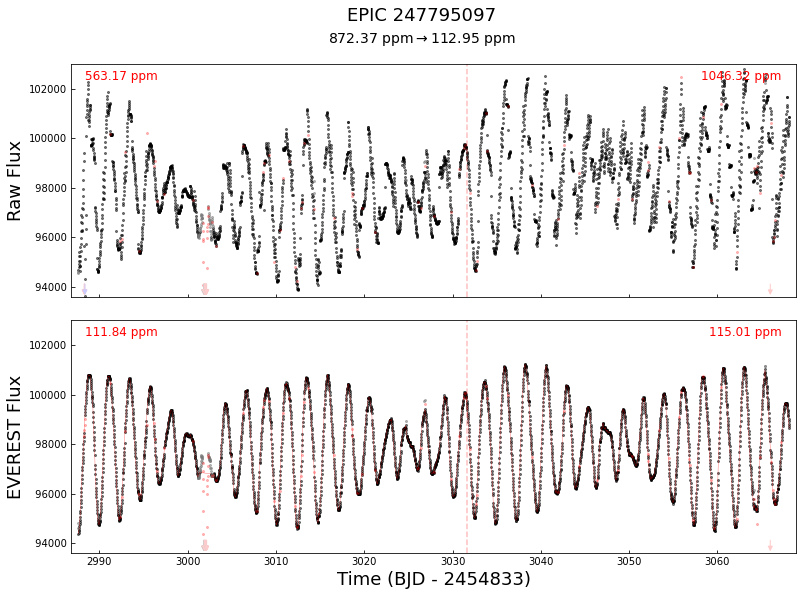

In [2]:
# retrieve light curve
v928tau = everest.Everest(247795097)

# plot light curve
v928tau.plot()

In [3]:
# extract data
time  = v928tau.time              # time
flux  = v928tau.fcor              # corrected flux
error = v928tau.cdpp / 1e6        # Combined Differential Photometric Precision in ppm
error *= np.ones_like(flux)       # making an error array

# remove nan's
mask = ~np.isnan(flux)
time  = time[mask]
flux  = flux[mask]
error = error[mask]

# normalise flux
flux  = flux / np.median(flux) 

In [4]:
# save
data_everest = np.vstack((time, flux, error)).T
np.savetxt('data/photometry/everest_lightcurve.txt', data_everest, 
           header='BJD-2454833, Flux, Error')

## Preparing the Light Curve

To prepare the light curve for the modeling of the stellar variation, we must mask out the eclipse and any significant outliers. We identify the eclipse as taking place between time 3001 and 3003 so plot between these limits to identify the eclipse.

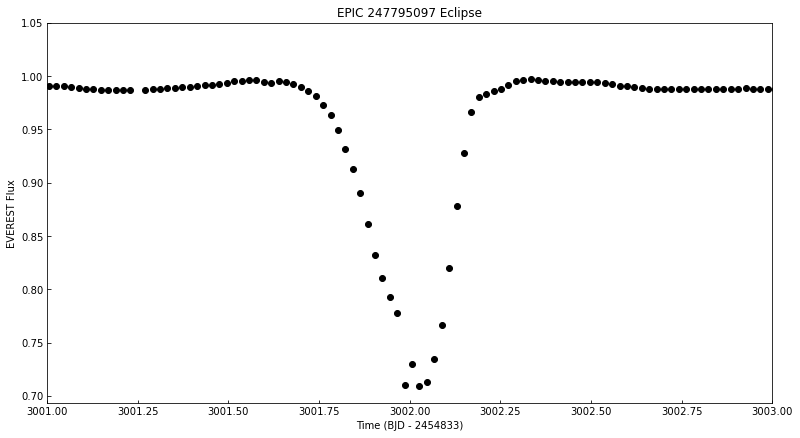

In [5]:
# plot the eclipse
plt.figure(figsize=(13,7))
plt.xlim(3001,3003)
plt.xlabel('Time (BJD - 2454833)')
plt.ylabel('EVEREST Flux')
plt.title('EPIC 247795097 Eclipse')
plt.errorbar(time, flux, yerr=error, fmt='o', color='k')
plt.show()

Removing bad data, particularly: the eclipse, the last bit of data, and flux outliers < 95%

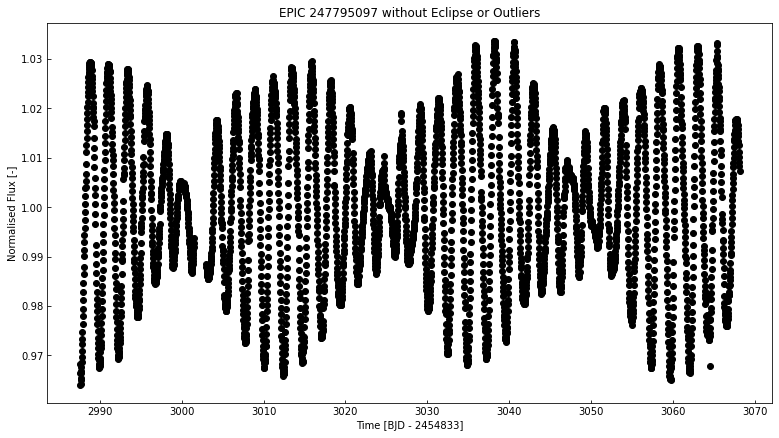

In [6]:
# mask out eclipse
eclipse_mask = (time > 3001.5) * (time < 3003)
stellar_mask = ~eclipse_mask
#stellar_mask2 = (time < 3015)

# mask out flux outliers
flux_mask = flux > 0.95

# full mask
mask = (flux_mask * stellar_mask) # * stellar_mask2)

# sv = stellar variation
time_sv  = time[mask]
flux_sv  = flux[mask]
error_sv = error[mask]

# plot to check
plt.figure(figsize=(13,7))
plt.xlabel('Time [BJD - 2454833]')
plt.ylabel('Normalised Flux [-]')
plt.title('EPIC 247795097 without Eclipse or Outliers')
plt.errorbar(time_sv, flux_sv, yerr=error_sv, fmt='o', color='k')
plt.show()

## Creating the Model

We start off by fitting a linear trend and then performing a Lomb-Scargle analysis to determine the periods of the modulation. We then write an MCMC code with the best fit parameters from the linear and Lomb-Scargle fit to get the "best fit" for the model.

### Linear Component

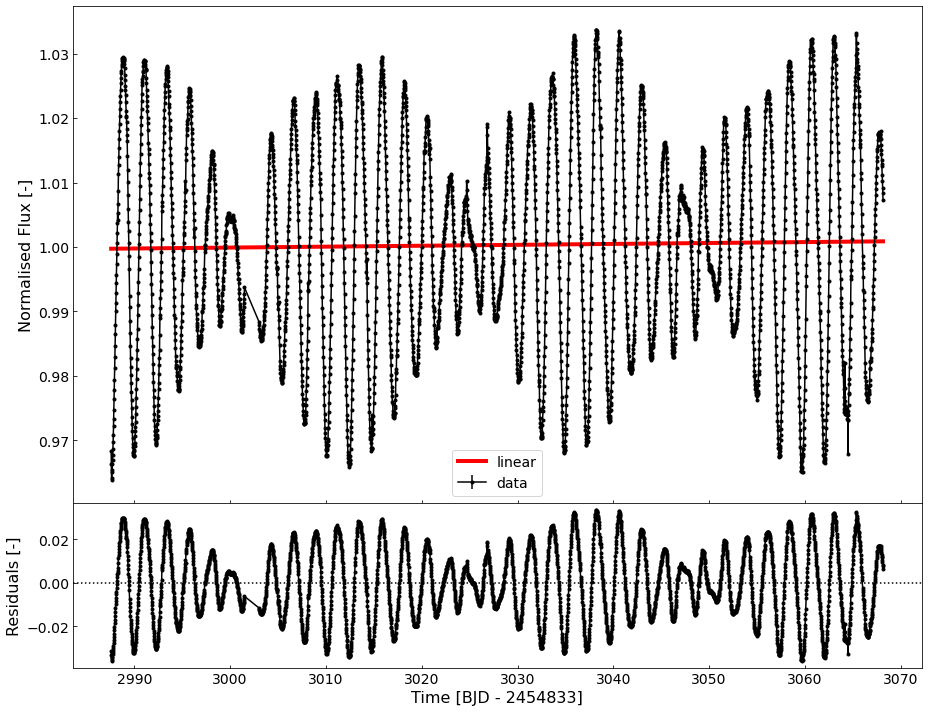

the best fit parameters are m = 0.000014218489, b = 0.999731740516


In [7]:
p_line, _ = curve_fit(sv.line, time_sv, flux_sv, sigma=error_sv)
line_flux = sv.line(time_sv, *p_line)

# sanity check with a plot
mcmc.plot_models(time_sv, flux_sv, error_sv, [sv.mcmc_line], [p_line], ['linear'])


print('the best fit parameters are m = %.12f, b = %.12f' % (p_line[0], p_line[1]))

### Lomb Scargle Periodogram

After performing a Lomb-Scargle periodogram to determine the periods, we need to fit the phase and the amplitude with the Levenberg-Marquadt least squares fitting.

In [228]:
from astropy.timeseries import LombScargle as ls
import pylab as pl
from IPython import display

def print_sines(p_beats, periods):
    '''prints the parameters of the model'''
    a1, a2, p1, p2 = p_beats
    P1, P2 = periods
    print('sine1 = %.3f sin(2 pi time / %.4f + %.4f)' % (a1, P1, p1))
    print('sine2 = %.3f sin(2 pi time / %.4f + %.4f)' % (a2, P2, p2))
    return None

def sines(time, amplitudes, periods, phases):
    ''' this model contains any number of sines '''
    model = 0
    for amp, prd, phs in zip(amplitudes, periods, phases):
        model += amp * np.sin(2 * np.pi * time / prd + phs)
    return model

def ls_periodogram(time, flux, periods, height=None, plot=True):
    ''' 
    this makes a periodogram and exports all the periods of the
    peaks above the height parameter
    '''
    frequencies = 2 * np.pi / periods
    periodogram = lombscargle(time, flux, frequencies)
    inds, heights = find_peaks(periodogram, height=height)
    peak_periods = periods[inds]
    if plot == True:
        fig = plt.figure(figsize=(16,8))
        ax = plt.gca()
        ax.set_title('Lomb-Scargle Periodogram of Stellar Variations')
        ax.set_xlabel('Period [days]')
        ax.set_ylabel('Power [-]')
        ax.plot(periods, periodogram, 'b-')
        for peak_period in peak_periods:
            ax.axvline(x=peak_period, color='k', ls=':')
        plt.show()
    return peak_periods

def lsp2(time, flux, error, height=0, plot=True, peak_ind=0):
    model = ls(time, flux, error)
    frequencies, power = model.autopower(minimum_frequency=0.25, maximum_frequency=10, samples_per_peak=10)
    periods = 1/frequencies
    inds, peaks = find_peaks(power, height=height)
    peaks = peaks['peak_heights']
    sort_peaks = np.argsort(peaks)
    inds  = inds[sort_peaks]
    peaks = peaks[sort_peaks]
    period = periods[inds[-1 - peak_ind]]
    flux_fit = model.model(time, 1/period)
    residuals = flux - flux_fit
    one_sine = lambda t, a, p: sines(t, [a], [period], [p])
    pb, _ = curve_fit(one_sine, time, flux, sigma=error)
    Pb = (pb[0], period, pb[1])
    if plot == True:
        # periodogram
        fig = plt.figure(figsize=(16, 8))
        plt.title('Lomb-Scargle Periodogram of Stellar Variations')
        plt.xlabel('Period [days]')
        plt.ylabel('Power [-]')
        plt.plot(periods, power, 'b-')
        plt.gca().axvline(x=period, color='k', ls=':')
        plt.show()
        # folded light curve
        plot_folded(time, flux, error, period, pb)
        print('%.6f sin(2 pi time / %.4f + %.4f)' % Pb)
    return Pb, residuals
    

def plot_folded(time, flux, error, period, pb=(0,0), xlim=(0,1)):
    a, p = pb
    phase = (time % period) / period
    fig = plt.figure(figsize=(16, 8))
    plt.xlabel('phase [-]')
    plt.ylabel('normalised flux [-]')
    plt.title('Folded Light Curve [Period = %.4f]' % period)
    plt.errorbar(phase, flux, yerr=error, fmt='.', color='k')
    sort = np.argsort(phase)
    plt.plot(phase[sort], a * np.sin(2 * np.pi * time[sort] / period + p),'r-', lw=8)
    plt.xlim(xlim)
    plt.show()
    return None

#### 1st Round of the Lomb-Scargle

First we make a periodogram and identify the peaks

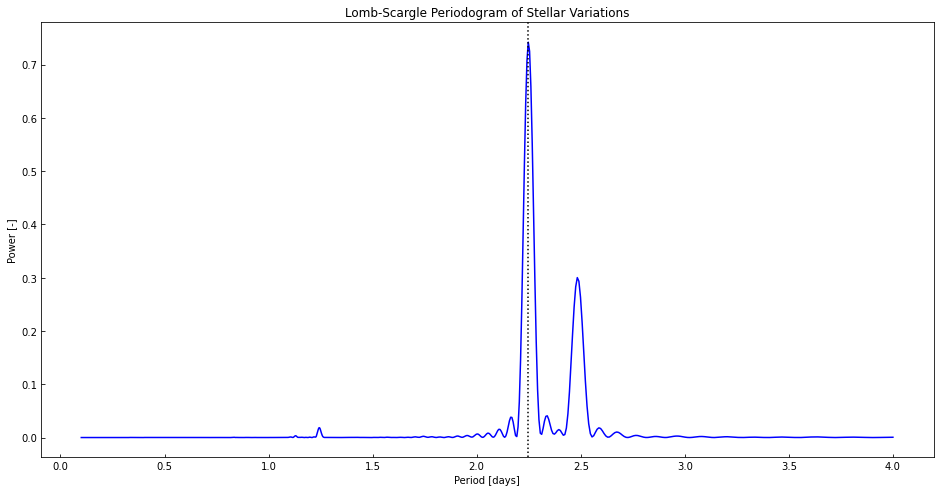

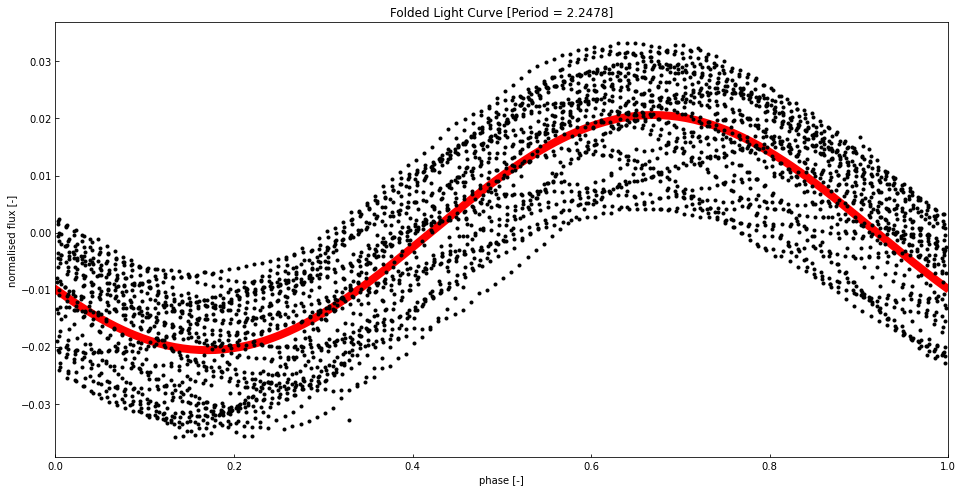

-0.020604 sin(2 pi time / 2.2478 + 0.5024)


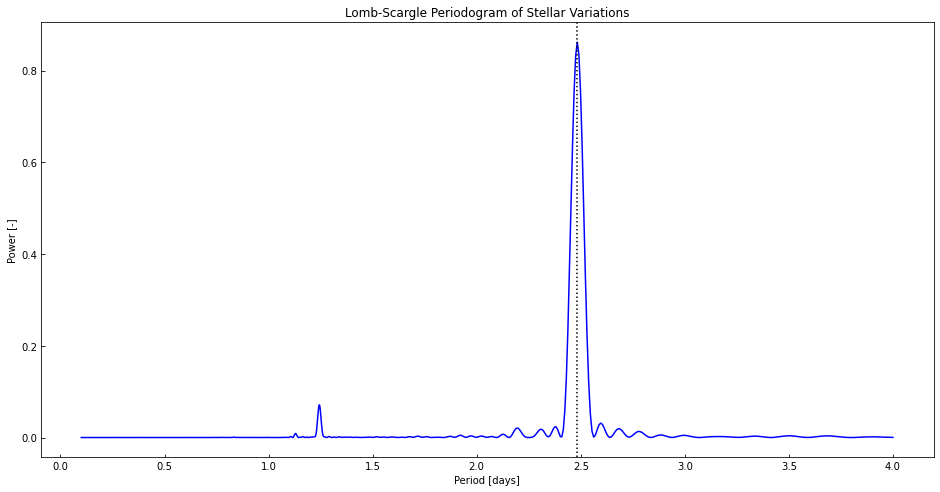

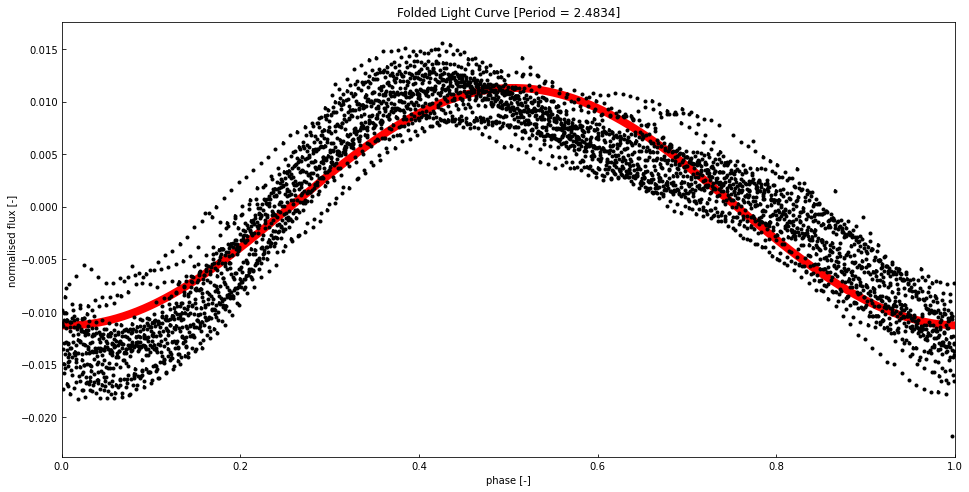

-0.011298 sin(2 pi time / 2.4834 + 1.5338)


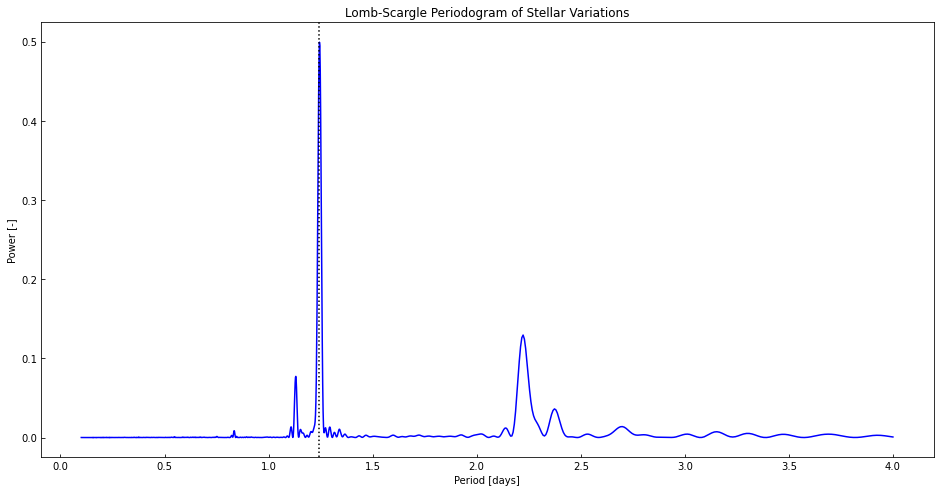

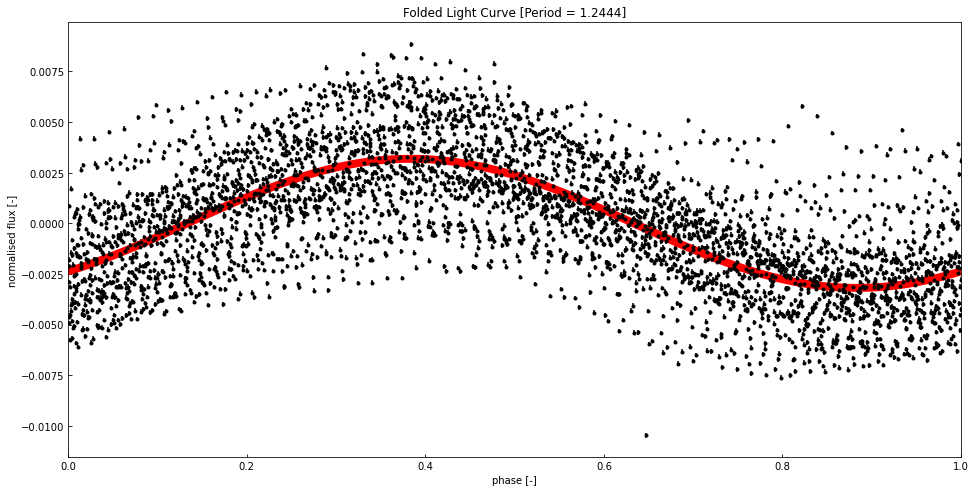

-0.003189 sin(2 pi time / 1.2444 + 2.3028)


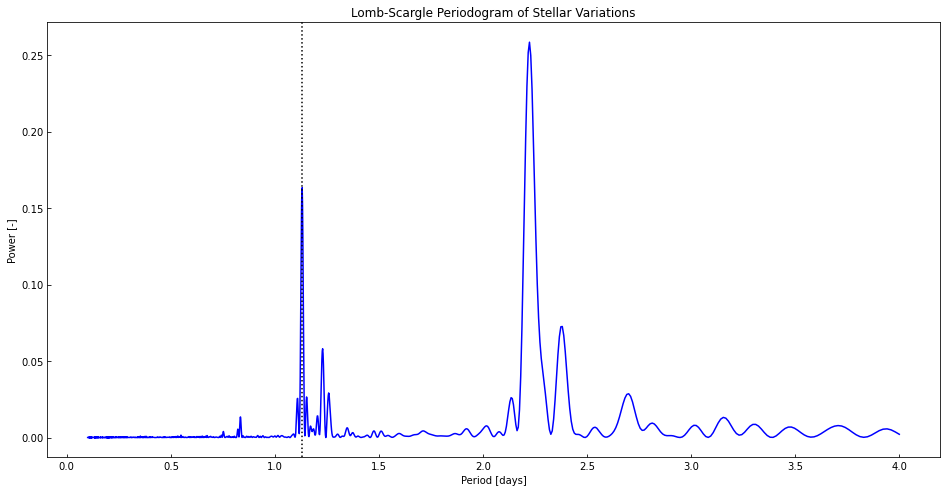

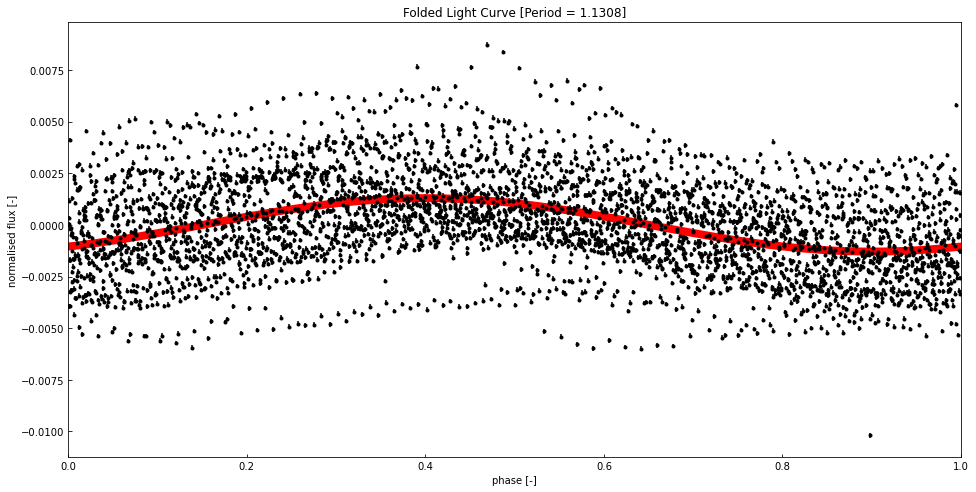

-0.001294 sin(2 pi time / 1.1308 + 2.1954)


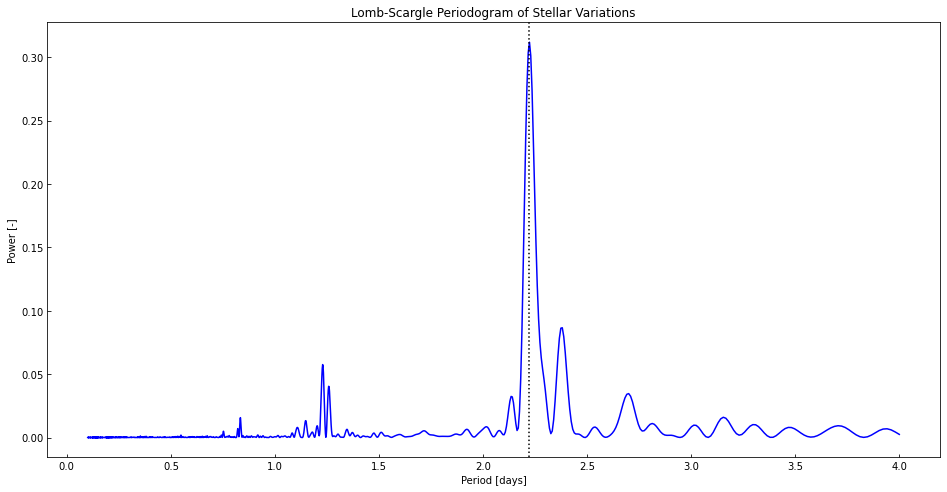

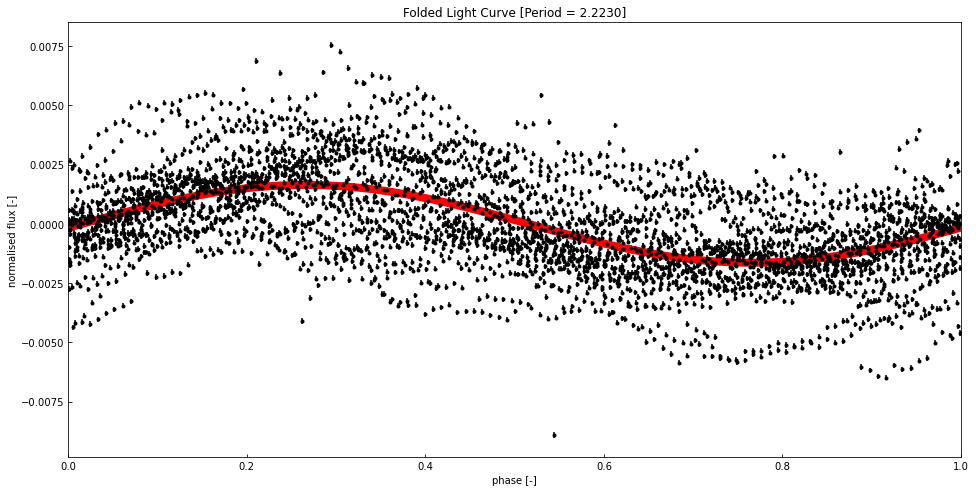

0.001640 sin(2 pi time / 2.2230 + -0.0975)


In [230]:
# new flux (removed linear trend) for lomb_scargle
ls1_flux = flux_sv - line_flux


ls_p1b, ls2_flux = lsp2(time_sv, ls1_flux, error_sv)
ls_p2b, ls3_flux = lsp2(time_sv, ls2_flux, error_sv)
ls_p3b, ls4_flux = lsp2(time_sv, ls3_flux, error_sv)
ls_p4b, ls5_flux = lsp2(time_sv, ls4_flux, error_sv, peak_ind=1)
ls_p5b, ls6_flux = lsp2(time_sv, ls5_flux, error_sv)

#for p in [ls_p1[0]]:
 #   plot_folded(time_sv, ls1_flux, error_sv, p, ls1_pb)
    


In [232]:
for pb in [ls_p1b, ls_p2b, ls_p3b, ls_p4b, ls_p5b]:
    print('the period is %.4f' % pb[1])

the period is 2.2478
the period is 2.4834
the period is 1.2444
the period is 1.1308
the period is 2.2230


Now we fit the sinusoids to the data. We fix the periods by the value given by the periodogram.

[[-2.06042208e-02  2.24779658e+00  5.02418438e-01]
 [-1.12979931e-02  2.48338135e+00  1.53380588e+00]
 [-3.18890794e-03  1.24438707e+00  2.30282012e+00]
 [-1.29372606e-03  1.13084904e+00  2.19543156e+00]]
[-2.06042208e-02 -1.12979931e-02 -3.18890794e-03 -1.29372606e-03
  2.24779658e+00  2.48338135e+00  1.24438707e+00  1.13084904e+00
  5.02418438e-01  1.53380588e+00  2.30282012e+00  2.19543156e+00]


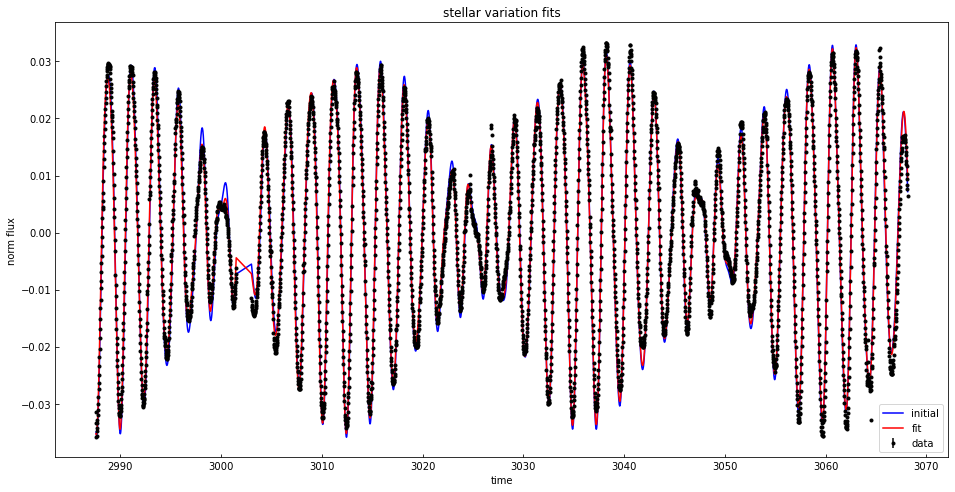

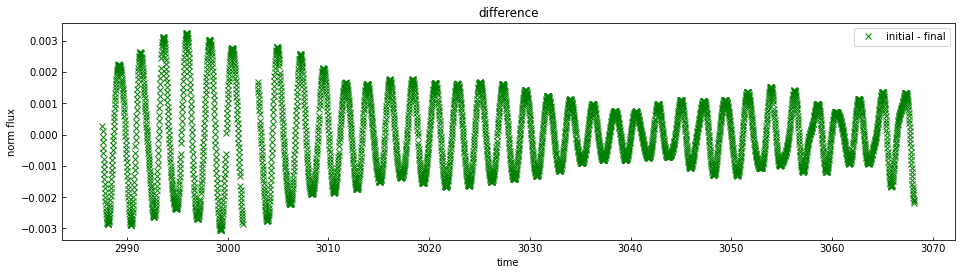

initial chi2 = 1284445.35
final chi2   =  815361.59
[-1.96762147e-02 -1.15034503e-02 -3.22251569e-03 -1.31667783e-03
  2.24991441e+00  2.48242176e+00  1.24512857e+00  1.13013854e+00
  8.51476273e+00 -1.43252722e+00  1.14132388e+01 -8.40073150e+00]


In [248]:
PBS = np.array([ls_p1b, ls_p2b, ls_p3b, ls_p4b])
print(PBS)
print(PBS.T.flatten())
four_sine = lambda t, a1, a2, a3, a4, t1, t2, t3, t4, p1, p2, p3, p4: sines(t, [a1,a2,a3,a4],[t1,t2,t3,t4],[p1,p2,p3,p4])

p0, _ = curve_fit(four_sine, time_sv, ls1_flux, sigma=error_sv, p0=PBS.T.flatten())

plt.figure(figsize=(16, 8))
plt.title('stellar variation fits')
plt.xlabel('time')
plt.ylabel('norm flux')
plt.errorbar(time_sv, ls1_flux, error_sv, fmt='.', color='k', label='data')
plt.plot(time_sv, four_sine(time_sv, *PBS.T.flatten()), 'b-', label='initial')
plt.plot(time_sv, four_sine(time_sv, *p0), 'r-', label='fit')
plt.legend()
plt.show()

plt.figure(figsize=(16,4))
plt.title('difference')
plt.xlabel('time')
plt.ylabel('norm flux')
plt.plot(time_sv, four_sine(time_sv, *PBS.T.flatten())-four_sine(time_sv, *p0), 'gx', label='initial - final')
plt.legend()
plt.show()

ci = np.sum(((ls1_flux - four_sine(time_sv, *PBS.T.flatten()))/error_sv)**2)
cf = np.sum(((ls1_flux - four_sine(time_sv, *p0))/error_sv)**2)
print('initial chi2 = %.2f' % ci)
print('final chi2   =  %.2f' % cf)


print(p0)

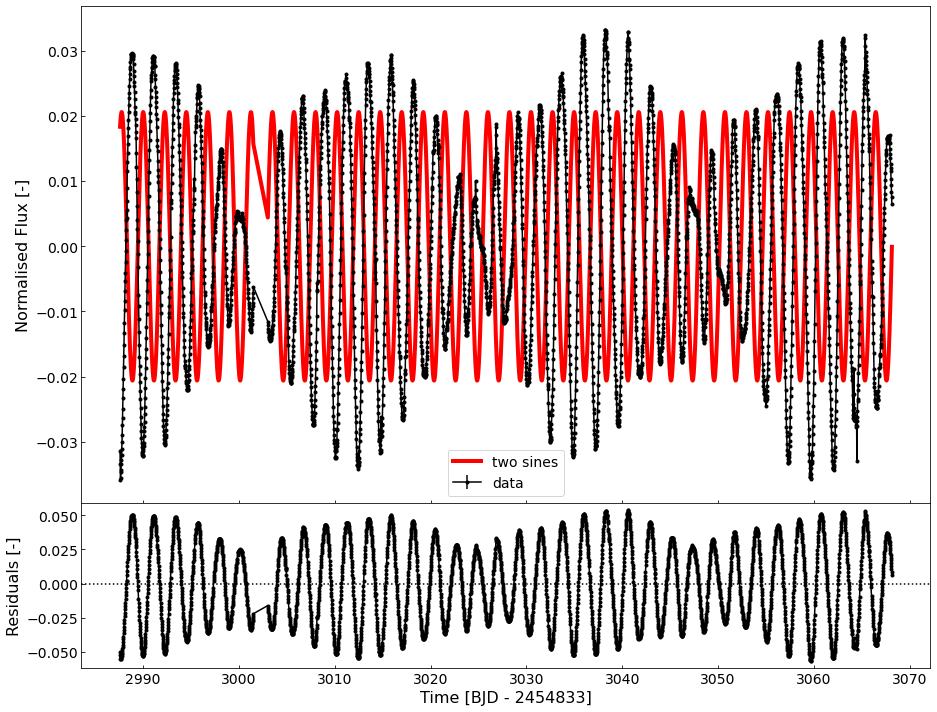

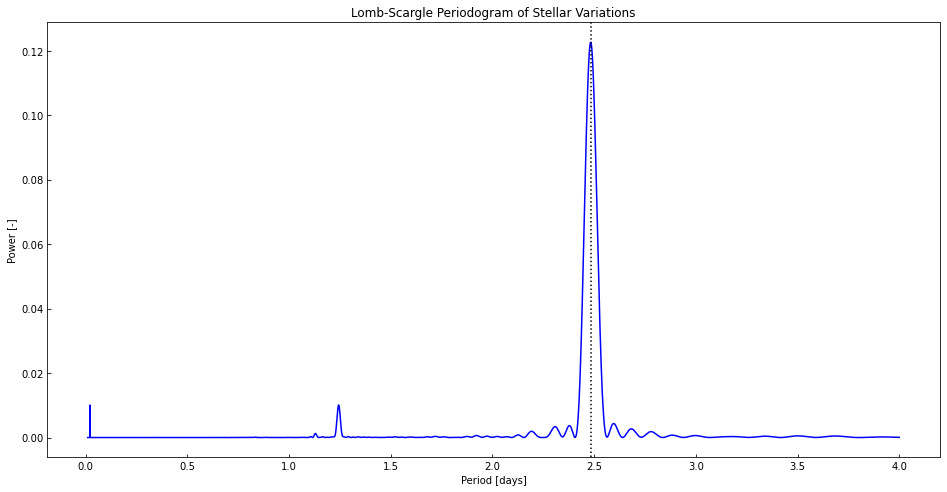

[2.483002]


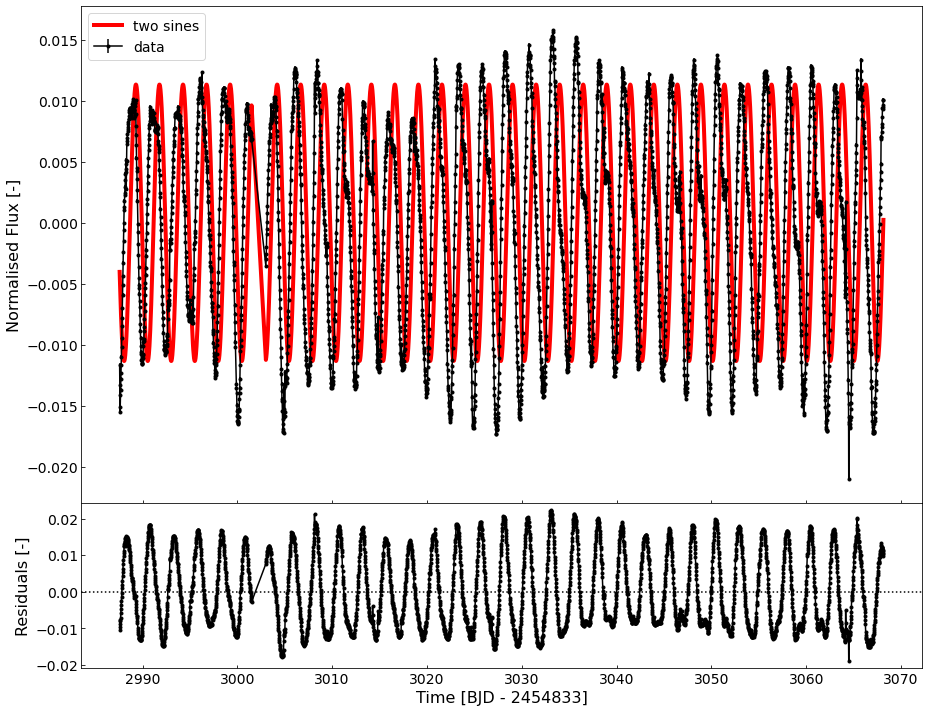

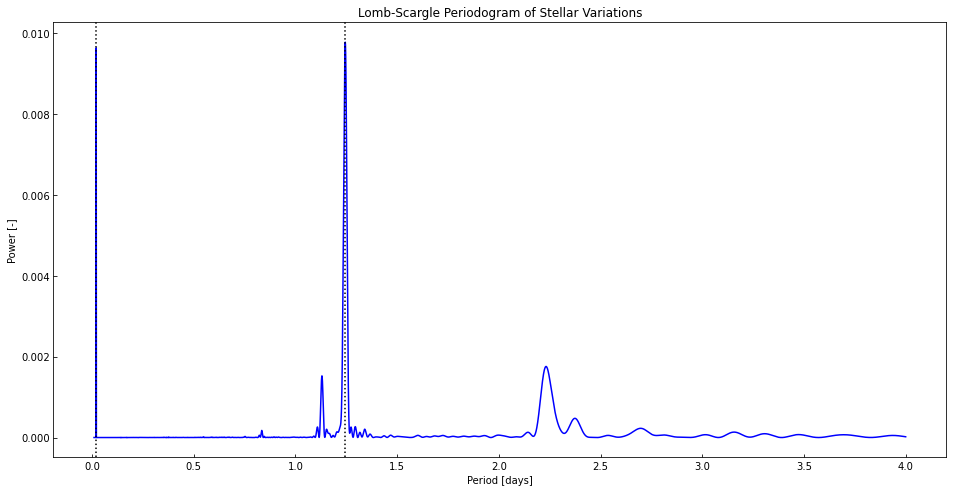

[1.244905]


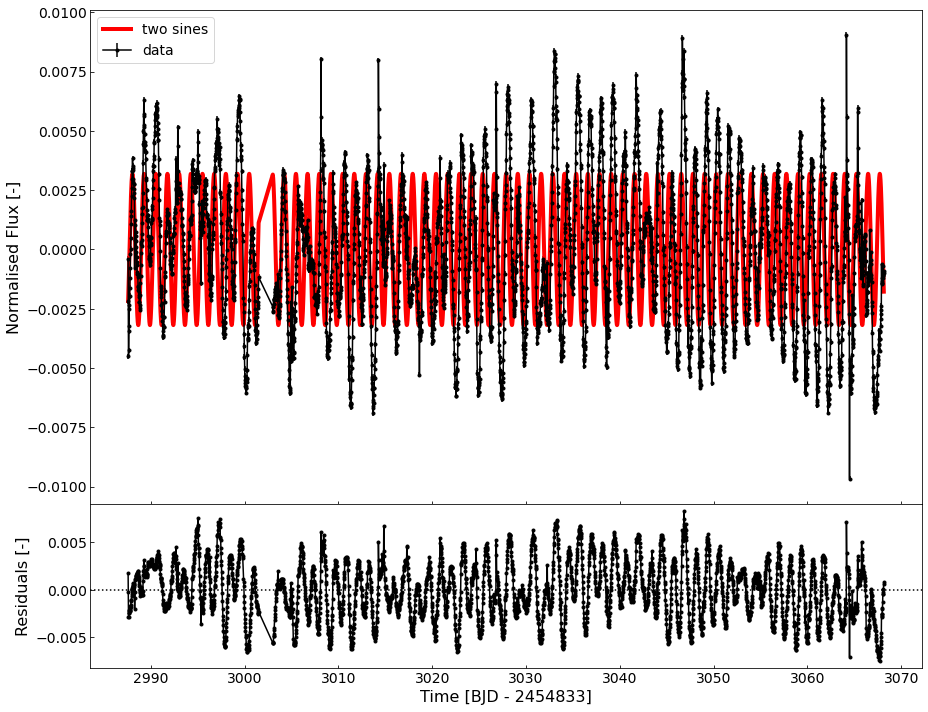

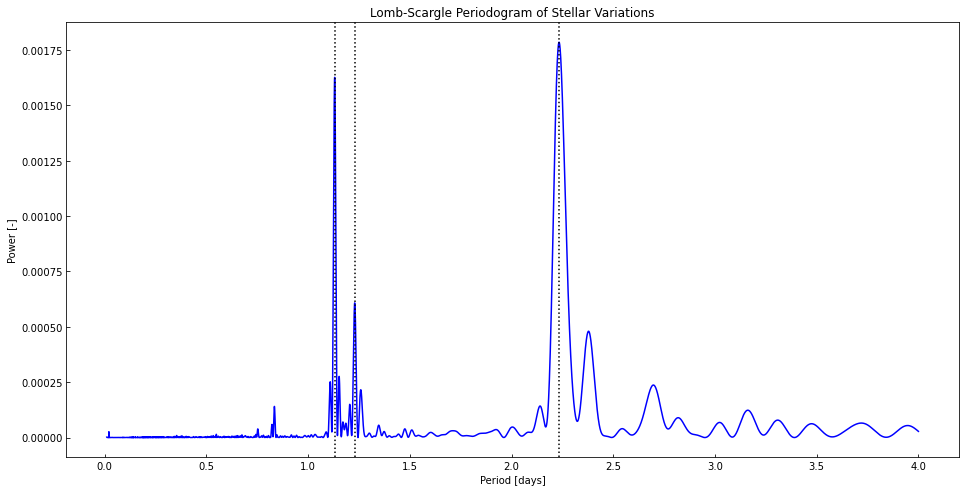

[1.130392 1.228945 2.233228]


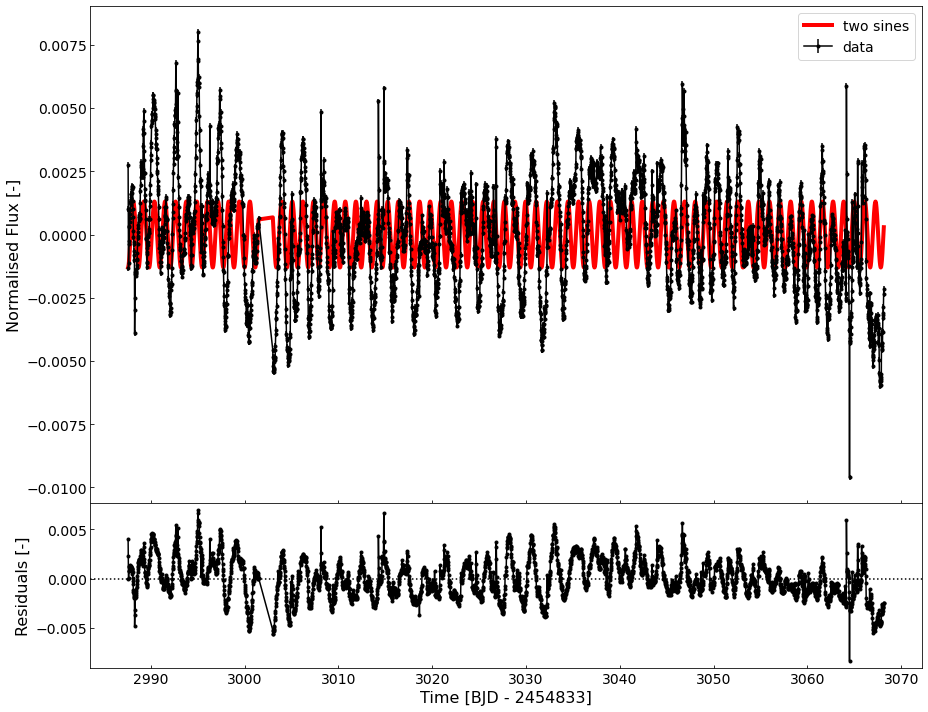

array([1139375.8026848])

In [100]:
# do curve fitting with fixed periods
ls1_2sine = lambda t, a1, p1: sines(t, [a1], [ls_p1[0]], [p1])
ls1_pb, _ = curve_fit(ls1_2sine, time_sv, ls1_flux, sigma=error_sv)

# creating the model and residuals
ls1_mflux = ls1_2sine(time_sv, *ls1_pb)
ls2_flux  = ls1_flux - ls1_mflux

# sanity check with a plot
p_b1 = (ls1_pb[0], 0, ls_p1[0], 1, ls1_pb[1], 0) # add periods!
mcmc.plot_models(time_sv, ls1_flux, error_sv, [sv.mcmc_two_sines], [p_b1], ['two sines'])

ls_p2 = ls_periodogram(time_sv, ls2_flux, periods, 0.10)
print(ls_p2)

ls2_2sine = lambda t, a1, p1: sines(t, [a1], [ls_p2[0]], [p1])
ls2_pb, _ = curve_fit(ls2_2sine, time_sv, ls2_flux, sigma=error_sv)

# creating the model and residuals
ls2_mflux = ls2_2sine(time_sv, *ls2_pb)
ls3_flux  = ls2_flux - ls2_mflux

# sanity check with a plot
p_b2 = (ls2_pb[0], 0, ls_p2[0], 1, ls2_pb[1], 0) # add periods!
mcmc.plot_models(time_sv, ls2_flux, error_sv, [sv.mcmc_two_sines], [p_b2], ['two sines'])

ls_p3 = [ls_periodogram(time_sv, ls3_flux, periods, 0.008)[1]]
print(ls_p3)

ls3_2sine = lambda t, a1, p1: sines(t, [a1], [ls_p3[0]], [p1])
ls3_pb, _ = curve_fit(ls3_2sine, time_sv, ls3_flux, sigma=error_sv)

# creating the model and residuals
ls3_mflux = ls3_2sine(time_sv, *ls3_pb)
ls4_flux  = ls3_flux - ls3_mflux

# sanity check with a plot
p_b3 = (ls3_pb[0], 0, ls_p3[0], 1, ls3_pb[1], 0) # add periods!
mcmc.plot_models(time_sv, ls3_flux, error_sv, [sv.mcmc_two_sines], [p_b3], ['two sines'])



ls_p4 = ls_periodogram(time_sv, ls4_flux, periods, 0.0005)
print(ls_p4)

ls4_2sine = lambda t, a1, p1: sines(t, [a1], [ls_p4[0]], [p1])
ls4_pb, _ = curve_fit(ls4_2sine, time_sv, ls4_flux, sigma=error_sv)

# creating the model and residuals
ls4_mflux = ls4_2sine(time_sv, *ls4_pb)
ls5_flux  = ls4_flux - ls4_mflux

# sanity check with a plot
p_b4 = (ls4_pb[0], 0, ls_p4[0], 1, ls4_pb[1], 0) # add periods!
mcmc.plot_models(time_sv, ls4_flux, error_sv, [sv.mcmc_two_sines], [p_b4], ['two sines'])

The variations have been driven down significantly by this two modulation model. The residuals show a maximum deviation of about ~0.8%. Let's see if we can drive this down further. We note that there is still an apparent beating pattern.

#### Second round of the Lomb-Scargle

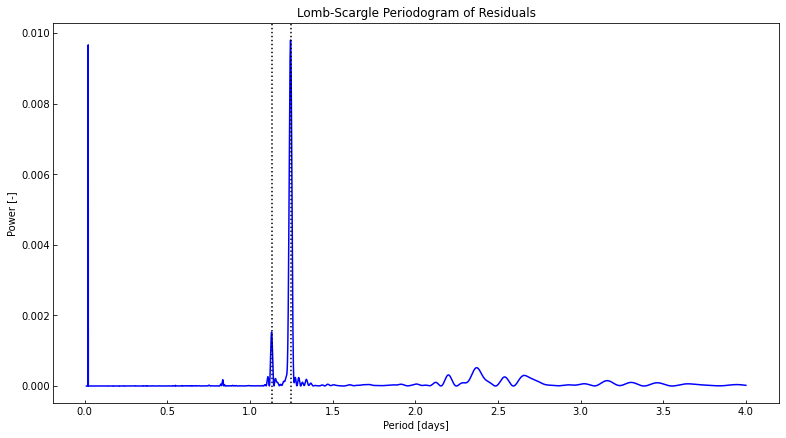

maxima are at P = 1.1304 and 1.2449 days


In [11]:
# new flux (removed linear trend and 2 sinusoids) for lomb_scargle
flux_ls2 = sine1_residuals

# find the period values of the peaks
periodogram2 = lombscargle(time_sv, flux_ls2, frequencies)
ind2, h2 = find_peaks(periodogram2, height=0.0008)
P2       = periods[ind2]
# we do not believe the peak at 0.021 days as this is too fast so
P2 = P2[1:3]

# creating and plotting periodogram

plt.figure(figsize=(13,7))
plt.title('Lomb-Scargle Periodogram of Residuals')
plt.plot(periods, periodogram2, 'b-')
plt.gca().axvline(x=P2[0], color='k', ls=':')
plt.gca().axvline(x=P2[1], color='k', ls=':')
plt.xlabel('Period [days]')
plt.ylabel('Power [-]')
plt.show()

print('maxima are at P = %.4f and %.4f days' % (min(P2), max(P2)))

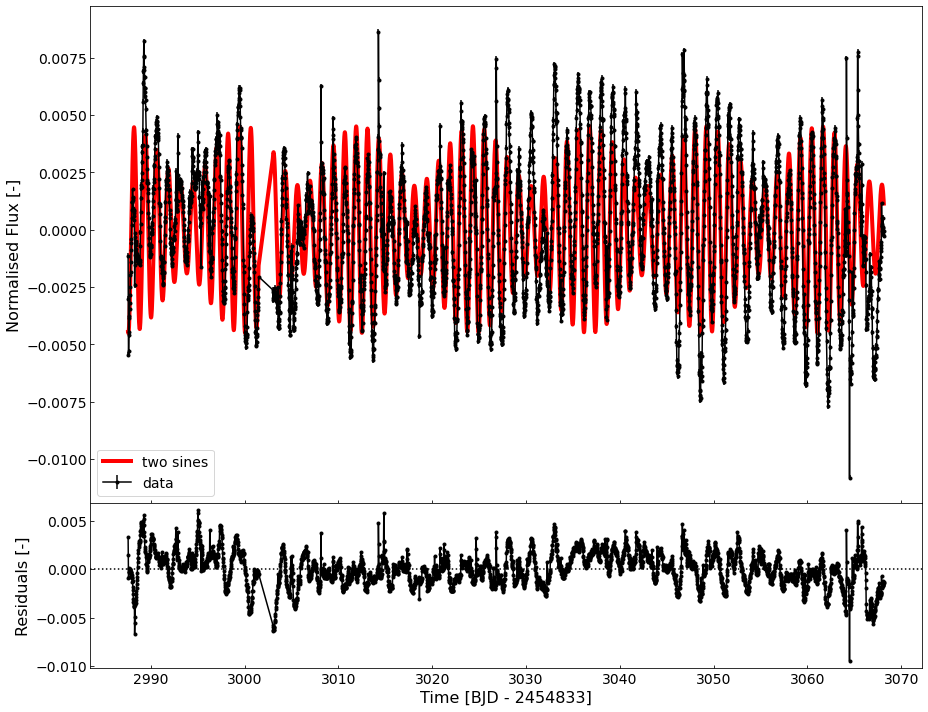

sine1 = -0.001 sin(2 pi time / 1.1304 + 1.4139)
sine2 = -0.003 sin(2 pi time / 1.2449 + 1.4210)


In [12]:
ls_sines2 = lambda t, a1, a2, p1, p2: sv.two_sines(t, a1, a2, P2[0], P2[1], p1, p2)
p_beats2, _ = curve_fit(ls_sines2, time_sv, flux_ls2, sigma=error_sv)

# creating the model and residuals
sine2_flux = ls_sines2(time_sv, *p_beats2)
sine2_residuals = sine1_residuals - ls_sines2(time_sv, *p_beats2)

# sanity check with a plot
p_b2 = (p_beats2[0], p_beats2[1], P2[0], P2[1], p_beats2[2], p_beats2[3]) # add periods!
mcmc.plot_models(time_sv, flux_ls2, error_sv, [sv.mcmc_two_sines], [p_b2], ['two sines'])
print_sines(p_beats2, P2)

#### Third round of the Lomb-Scargle

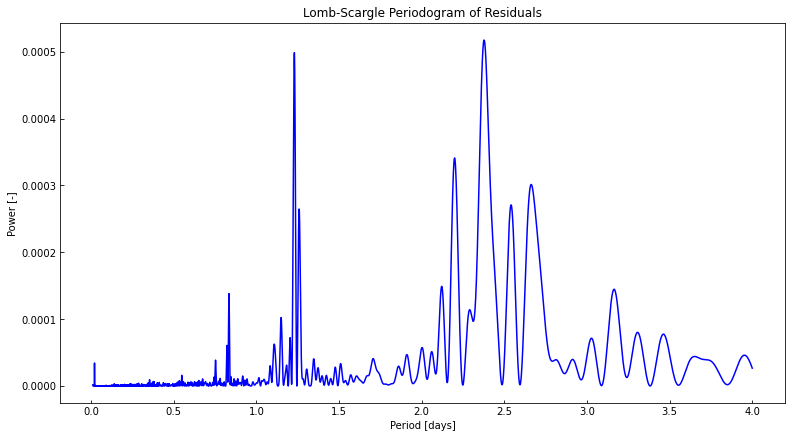

In [13]:
# new flux (removed linear trend and 2 sinusoids) for lomb_scargle
flux_ls3 = sine2_residuals

# find the period values of the peaks
periodogram3 = lombscargle(time_sv, flux_ls3, frequencies)
ind3, h3 = find_peaks(periodogram3, height=0.0001)
P3       = periods[ind3]

# creating and plotting periodogram
plt.figure(figsize=(13,7))
plt.title('Lomb-Scargle Periodogram of Residuals')
plt.plot(periods, periodogram3, 'b-')
plt.xlabel('Period [days]')
plt.ylabel('Power [-]')
plt.show()

There is no obvious peak, so we are left with 4 periods. These periods of interest that bring down the stellar variations are $P_1, P_2, P_3, P_4 = 2.23, 2.52, 1.25$ and $1.13$ days. Below we determine whether or not these are harmonics of each other.

In [14]:
# assign the periods
Periods = np.array(sorted([*P1,*P2]))

# for each period determine what the minimum

def test_harmonic(fund_period, test_periods): 
    try:
        ratios = test_periods / fund_period 
        harmonics = np.round(ratios).astype(np.int) 
        discrepancies = 100 * np.abs(harmonics - ratios) 
        for test_period, harmonic, discrepancy in zip(test_periods, harmonics, discrepancies): 
            print('the discrepancy between %.4f and %.4f is %.2f %% in the %i harmonic' % (fund_period, test_period, discrepancy, harmonic)) 
    except:
        pass
    return None

for num, Fund_Period in enumerate(Periods):
    test_harmonic(Fund_Period, Periods[num+1:])
    print('')

the discrepancy between 1.1304 and 1.2449 is 10.13 % in the 1 harmonic
the discrepancy between 1.1304 and 2.2488 is 1.06 % in the 2 harmonic
the discrepancy between 1.1304 and 2.4850 is 19.83 % in the 2 harmonic

the discrepancy between 1.2449 and 2.2488 is 19.36 % in the 2 harmonic
the discrepancy between 1.2449 and 2.4850 is 0.39 % in the 2 harmonic

the discrepancy between 2.2488 and 2.4850 is 10.50 % in the 1 harmonic




From this analysis it is clear that $P_1$ and $P_2$ are the two fundamental periods of the stellar variations, each with a single harmonic, namely $P_4$ and $P_3$ respectively. Any further cleaning is non-periodic and as such is beyond the scope of this cleaning (also it cleans noise on the order of ~0.5%).

## MCMC Fit

Now we run an MCMC routine to ensure that we get the best possible fit with multi-sampling of the parameter space, and then we can run a complex model with all free parameters. Below we define all the necessary MCMC routines

In [15]:
# defining boundaries
ml, mu = (-0.1, 0.1)    # slope
bl, bu = (0.9, 1.1)     # y-intercept
al, au = (-0.05, 0.05)  # amplitudes of sines
tl, tu = (0., 4.)       # periods of sines
pl, pu = (0., 2*np.pi)  # phases of sines

bounds = [(ml, mu), (bl, bu), (al, au), (al, au), (al, au), (al, au),
          (tl, tu), (tl, tu), (tl, tu), (tl, tu), (pl, pu), (pl, pu),
          (pl, pu), (pl, pu)]

### Gaussian Ball

This MCMC routine will look centred on the solution found by the Lomb-Scargle sections above

In [16]:
# create P
amp = [*p_beats1[0:2], *p_beats2[0:2]]
prd = [*P1, *P2]
phs = [*p_beats1[2:], *p_beats2[2:]]
P = [*p_line, *amp, *prd, *phs]


In [17]:
# parameter names and units
lbls = ['slope', 'y-intercept', 'amplitude 1', 'amplitude 2', 
        'amplitude 3', 'amplitude 4', 'period 1', 'period 2', 
        'period 3', 'period 4', 'phase 1', 'phase 2', 'phase 3',
        'phase 4']
units = ['L*/day', 'L*', 'L*', 'L*', 'L*', 'L*', 'day', 'day', 
         'day', 'day', 'rad', 'rad', 'rad', 'rad']

Run the MCMC itself

#### Small Ball (1e-8)

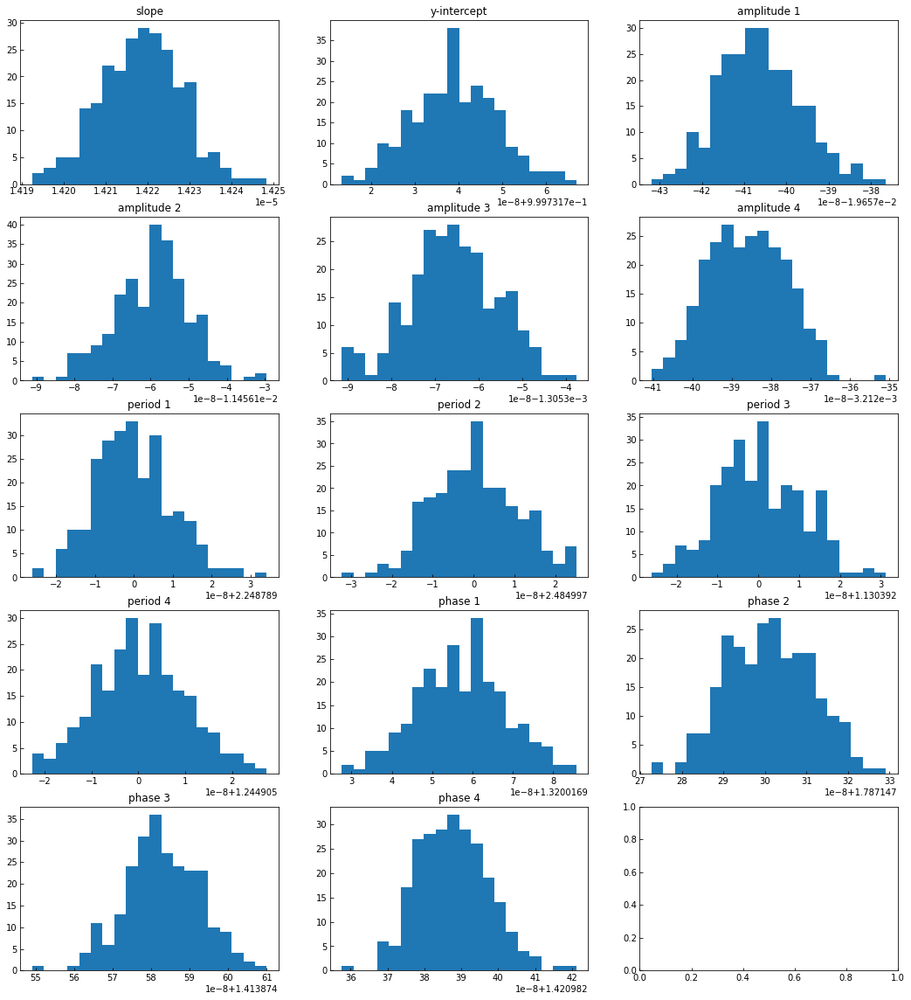

In [18]:
# get gaussian p0
p0_small = mcmc.ball_p0(P, 250, 1e-8, bounds)
# plot histogram
mcmc.plot_hist(p0_small, lbls=lbls, ncols=3)

In [19]:
# setting savename
be_small = 'models/mcmc_backends/sv_gb_1e-8.h5'

# run MCMC
args = (time_sv, flux_sv, error_sv, sv.stellar_variation_model, sv.stellar_variation_prior)
#pb_small, sampler_small = mcmc.run_mcmc(*args, p0_small, 10000, savename=be_small, reset=False)

# load MCMC
BE_small = emcee.backends.HDFBackend(be_small)
sampler_small = emcee.EnsembleSampler(250, 14, mcmc.lnprob, args=args, backend=BE_small)

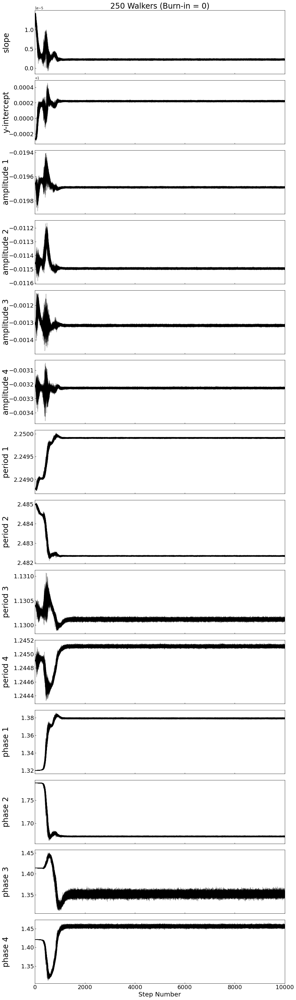

In [20]:
mcmc.plot_walkers(sampler_small, lbls=lbls)

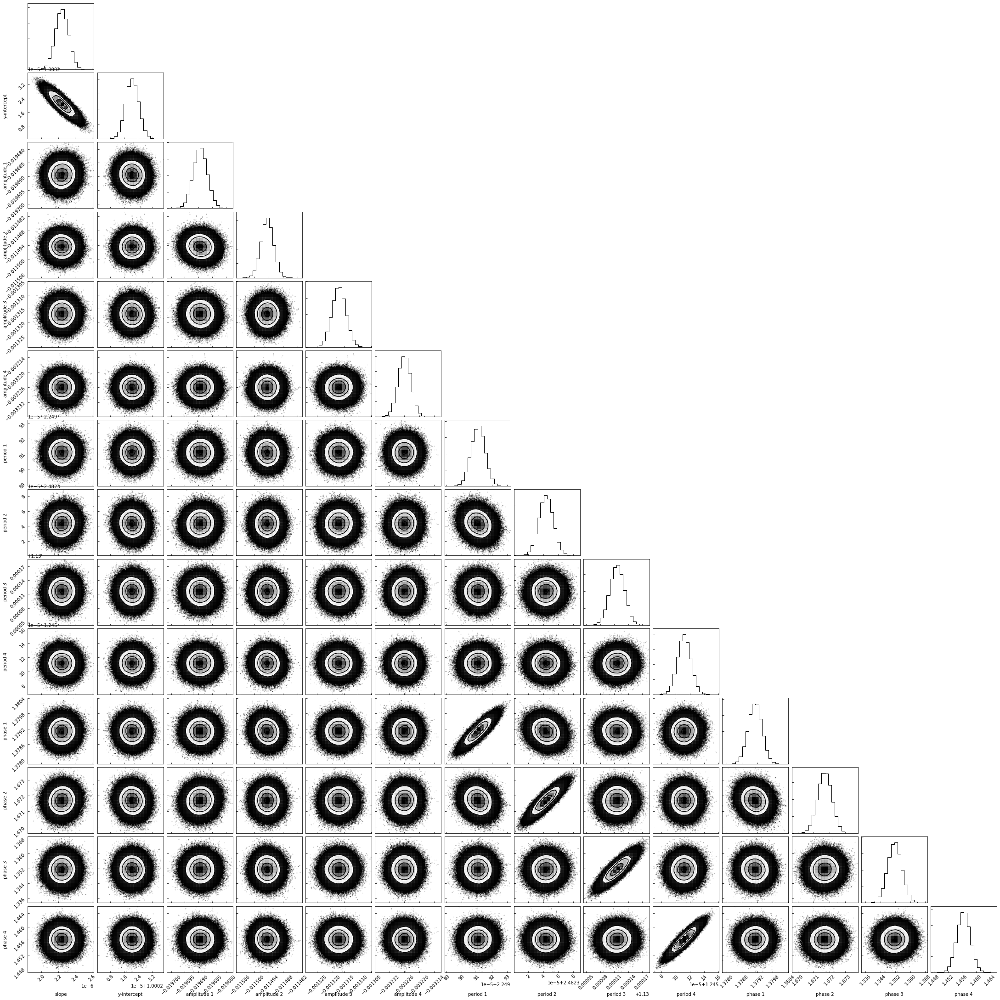

In [21]:
mcmc.plot_triangle(sampler_small, cut=2000, lbls=lbls)

In [22]:
stats_small, Pb_small = mcmc.stats(sampler_small, cut=2000)

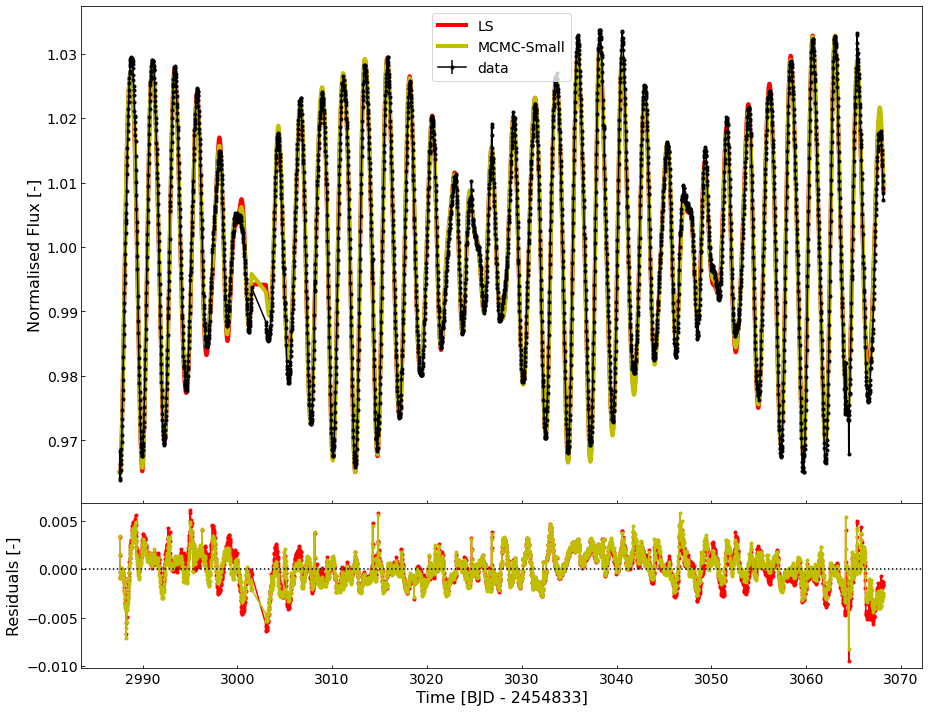

In [23]:
mcmc.plot_models(time_sv, flux_sv, error_sv, 2*[sv.stellar_variation_model], [P, Pb_small], 
                 ['LS','MCMC-Small'])

In [24]:
flux_mcmc_small  = sv.stellar_variation_model(Pb_small, time_sv)
flux_lombscargle = sv.stellar_variation_model(P, time_sv)
chi2_mcmc_small  = np.sum(((flux_sv - flux_mcmc_small)/flux_mcmc_small)**2)
chi2_lombscargle = np.sum(((flux_sv - flux_lombscargle)/flux_lombscargle)**2)

print('chi2 mcmc small   = %.16f' % chi2_mcmc_small)
print('chi2 lomb scargle = %.16f' % chi2_lombscargle)

chi2 mcmc small   = 0.0101505914116264
chi2 lomb scargle = 0.0118733535546148


#### Large Ball (1e-2)

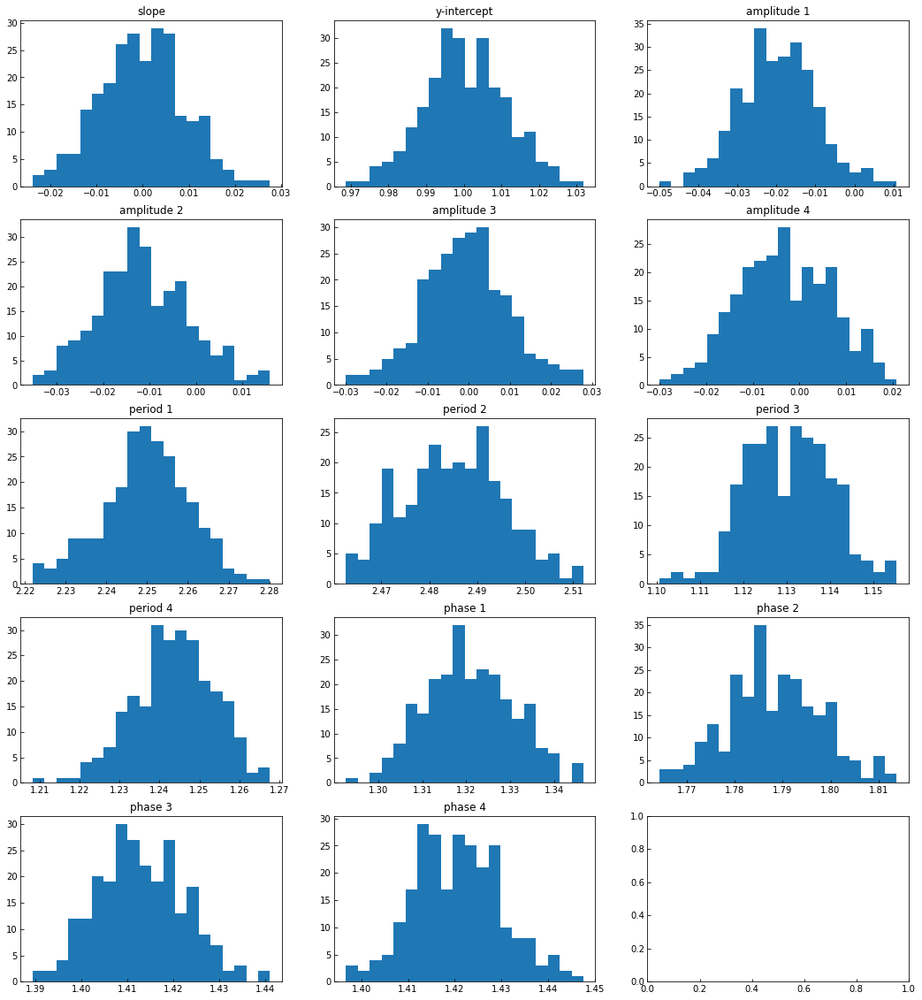

In [25]:
# get gaussian p0
p0_large = mcmc.ball_p0(P, 250, 1e-2, bounds)
# plot histogram
mcmc.plot_hist(p0_large, lbls=lbls, ncols=3)

In [26]:
# setting savename
be_large = 'models/mcmc_backends/sv_gb_1e-2.h5'

# run MCMC
#pb_large, sampler_large = mcmc.run_mcmc(*args, p0_large, 10000, savename=be_large, reset=False)

# load MCMC
BE_large = emcee.backends.HDFBackend(be_large)
sampler_large = emcee.EnsembleSampler(250, 14, mcmc.lnprob, args=args, backend=BE_large)

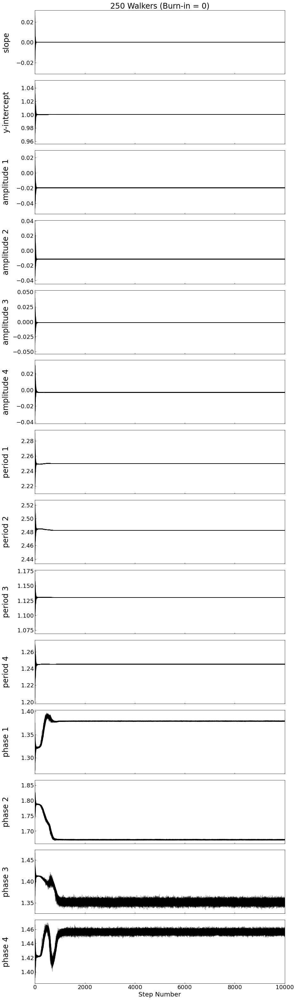

In [27]:
mcmc.plot_walkers(sampler_large, lbls=lbls)


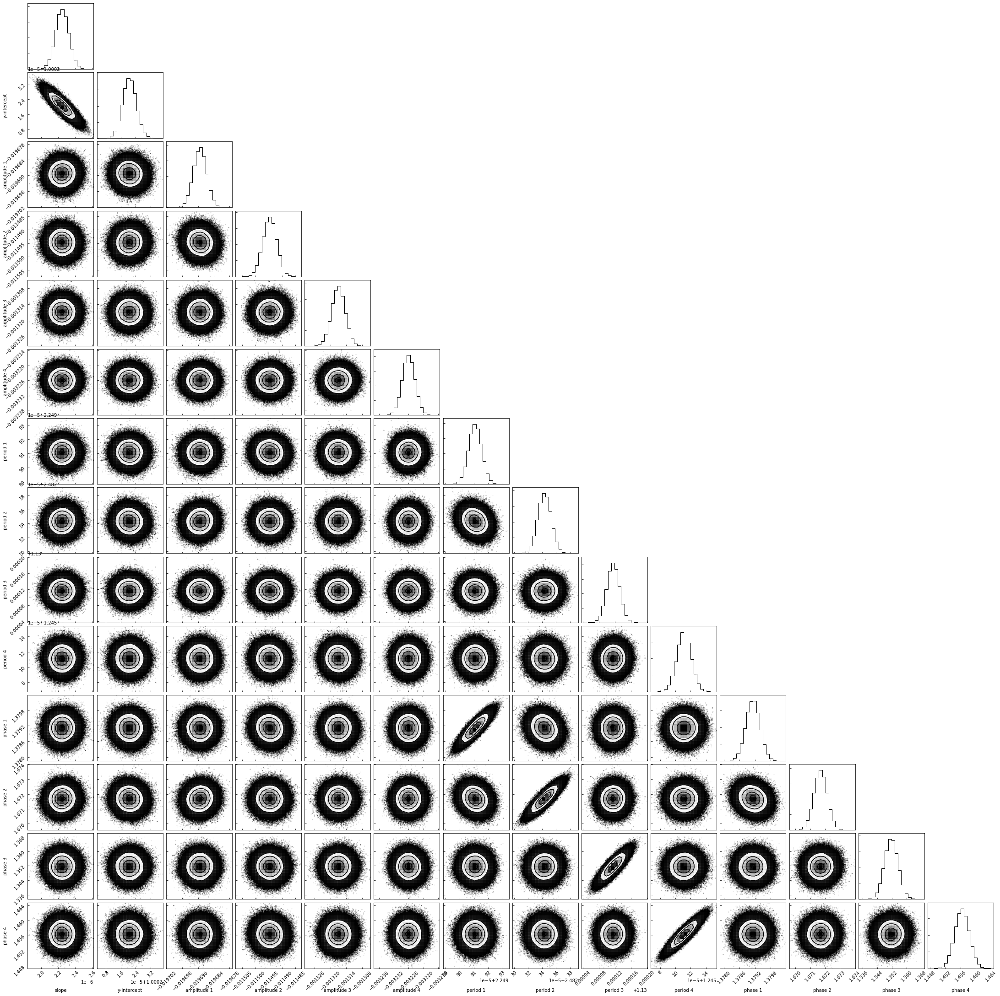

In [28]:
mcmc.plot_triangle(sampler_large, cut=2000, lbls=lbls)

In [29]:
stats_large, Pb_large = mcmc.stats(sampler_large, cut=2000)


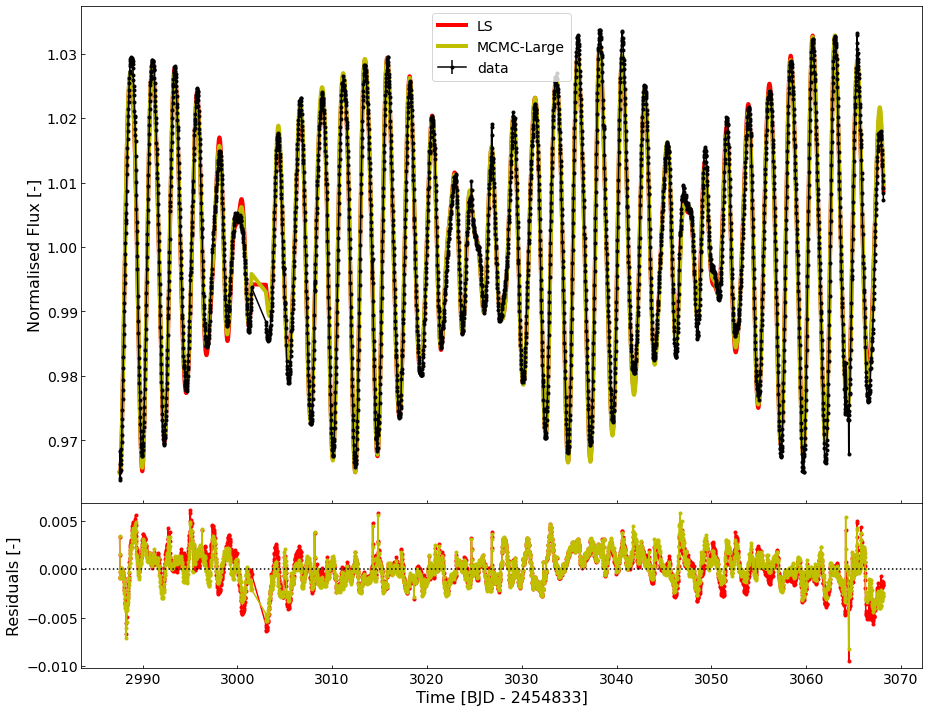

In [30]:
mcmc.plot_models(time_sv, flux_sv, error_sv, 2*[sv.stellar_variation_model], [P, Pb_large],
                 ['LS','MCMC-Large'])

In [31]:
flux_mcmc_large = sv.stellar_variation_model(Pb_large, time_sv)
chi2_mcmc_large = np.sum(((flux_sv - flux_mcmc_large)/flux_mcmc_large)**2)

print('chi2 mcmc large   = %.16f' % chi2_mcmc_large)
print('chi2 lomb scargle = %.16f' % chi2_lombscargle)

chi2 mcmc large   = 0.0101505865349337
chi2 lomb scargle = 0.0118733535546148


## Compare All

Here we compare the Lomb-Scargle Fit to the Large and the Small Gaussian Ball MCMC Fits.

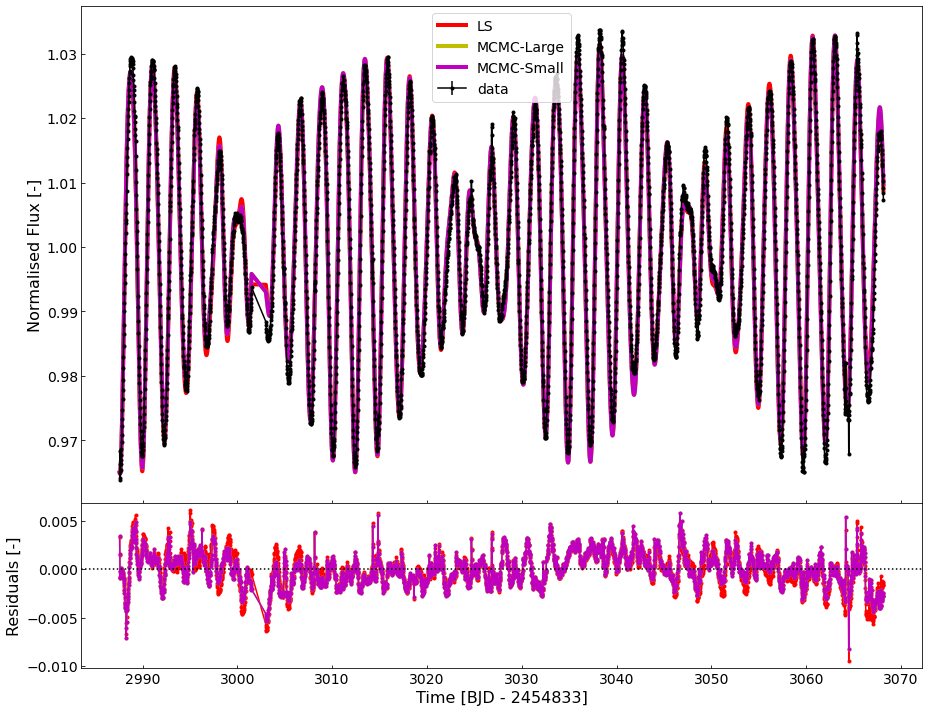

In [32]:
mcmc.plot_models(time_sv, flux_sv, error_sv, 3*[sv.stellar_variation_model], 
                 [P, Pb_large, Pb_small], ['LS','MCMC-Large', 'MCMC-Small'])

In [33]:
print('chi2 lomb scargle = %.16f' % chi2_lombscargle)
print('chi2 mcmc large   = %.16f' % chi2_mcmc_large)
print('chi2 mcmc small   = %.16f' % chi2_mcmc_small)


chi2 lomb scargle = 0.0118733535546148
chi2 mcmc large   = 0.0101505865349337
chi2 mcmc small   = 0.0101505914116264


In [34]:
print('for the Lomb-Scargle we find')
print('----------------------------')
mcmc.print_parameters(P, lbls, units, 8)

for the Lomb-Scargle we find
----------------------------
slope              =     +0.00001422     [L*/day]
y-intercept        =     +0.99973174     [L*]
amplitude 1        =     -0.01965741     [L*]
amplitude 2        =     -0.01145616     [L*]
amplitude 3        =     -0.00130537     [L*]
amplitude 4        =     -0.00321238     [L*]
period 1           =     +2.24878900     [day]
period 2           =     +2.48499700     [day]
period 3           =     +1.13039200     [day]
period 4           =     +1.24490500     [day]
phase 1            =     +1.32001696     [rad]
phase 2            =     +1.78714730     [rad]
phase 3            =     +1.41387458     [rad]
phase 4            =     +1.42098239     [rad]


In [36]:
print('for the MCMC large we find')
print('--------------------------')
mcmc.print_parameters(Pb_large, lbls, units, 8)

for the MCMC large we find
--------------------------
slope              =     +0.00000224     [L*/day]
y-intercept        =     +1.00022059     [L*]
amplitude 1        =     -0.01968931     [L*]
amplitude 2        =     -0.01149466     [L*]
amplitude 3        =     -0.00131699     [L*]
amplitude 4        =     -0.00322603     [L*]
period 1           =     +2.24991090     [day]
period 2           =     +2.48234334     [day]
period 3           =     +1.13011572     [day]
period 4           =     +1.24511125     [day]
phase 1            =     +1.37911097     [rad]
phase 2            =     +1.67168976     [rad]
phase 3            =     +1.35161609     [rad]
phase 4            =     +1.45637538     [rad]


In [37]:
print('for the MCMC small we find')
print('--------------------------')
mcmc.print_parameters(Pb_small, lbls, units, 8)

for the MCMC small we find
--------------------------
slope              =     +0.00000224     [L*/day]
y-intercept        =     +1.00022061     [L*]
amplitude 1        =     -0.01968935     [L*]
amplitude 2        =     -0.01149461     [L*]
amplitude 3        =     -0.00131696     [L*]
amplitude 4        =     -0.00322597     [L*]
period 1           =     +2.24991082     [day]
period 2           =     +2.48234342     [day]
period 3           =     +1.13011595     [day]
period 4           =     +1.24511162     [day]
phase 1            =     +1.37910567     [rad]
phase 2            =     +1.67169302     [rad]
phase 3            =     +1.35160453     [rad]
phase 4            =     +1.45644116     [rad]


We determine that the MCMC large gaussian ball contains the best fit parameters

## Determining Harmonics

Here we determine whether or not the periods for the sinusoids are harmonics of each other

In [38]:
Periods_MCMC = sorted(Pb_large[6:10])
print(Periods_MCMC)
for num, Fund_Period in enumerate(Periods_MCMC):
    test_harmonic(Fund_Period, Periods_MCMC[num+1:])
    print('')

[1.130115717282918, 1.2451112544942289, 2.2499108950563076, 2.4823433370404873]
the discrepancy between 1.1301 and 1.2451 is 10.18 % in the 1 harmonic
the discrepancy between 1.1301 and 2.2499 is 0.91 % in the 2 harmonic
the discrepancy between 1.1301 and 2.4823 is 19.65 % in the 2 harmonic

the discrepancy between 1.2451 and 2.2499 is 19.30 % in the 2 harmonic
the discrepancy between 1.2451 and 2.4823 is 0.63 % in the 2 harmonic

the discrepancy between 2.2499 and 2.4823 is 10.33 % in the 1 harmonic




We find that period 1 and 3 are harmonics (2nd) and period 2 and 4 are also harmonics (2nd).

## Saving Best Fit Parameters and Light Curve

In [39]:
# save best-fit parameters and light curve
np.save('models/best_fits/stellar_variation.npy', Pb_large)

In [40]:
# create the data file containing the light curve
delta_flux = flux - sv.stellar_variation_model(Pb_large, time)
blended_flux = delta_flux + 1
deblended_flux = 2 * delta_flux + 1

# saving the data file
data = np.vstack((time, blended_flux, deblended_flux, error)).T
np.savetxt('data/photometry/eclipse_lightcurve.txt', data, 
           header='BJD-2454833, Blended_Flux, Deblended_Flux, Error')

## Creating Paper Plot

The following plot is used for the paper to show the stellar variation model.

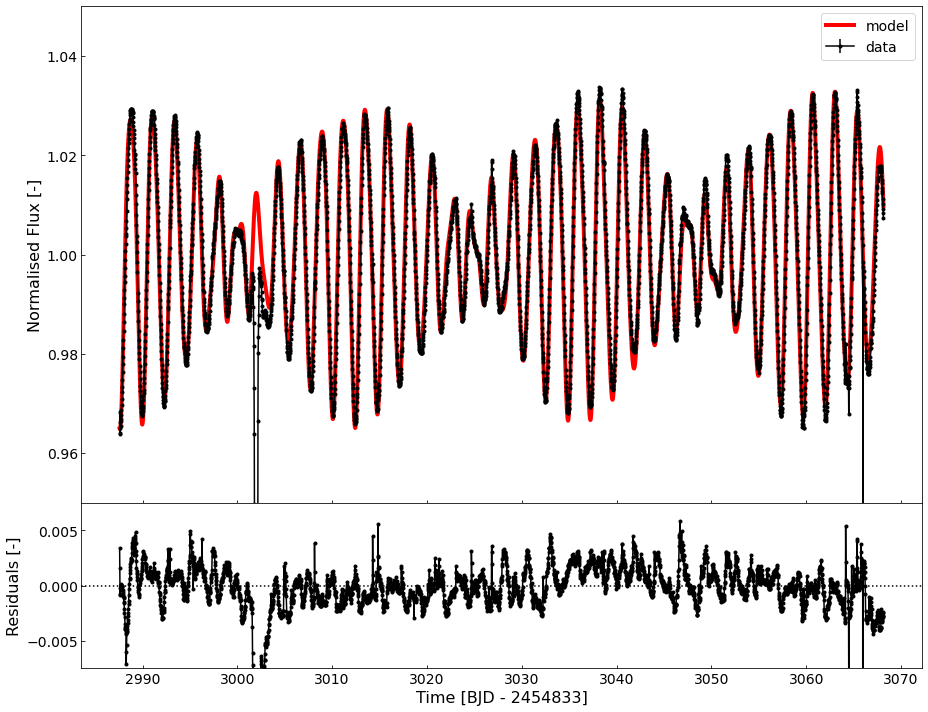

In [42]:
mcmc.plot_models(time, flux, error, [sv.stellar_variation_model], [Pb_large], ['model'], 
                 plot_lims=(0.95,1.05), residual_lims=(-0.0075,0.0075), 
                 savename='plots/paper/everest_lightcurve_model.png')